# 꽃을 분류해보자

### 꼭 필요한 메세지 외 경고 메세지가 출력되지 않도록 합시다

In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
!pip install pillow #파이썬 "Pillow" 패키지 인스톨 합니다

### 텐서플로우(TensorFlow)를 활용해서 이미지를 분류할 수 있는 모델을 설계해 보겠습니다.

In [3]:
import tensorflow as tf
print(tf.__version__)

2.2.0


### 텐서플로우에서 제공하는 강아지와 고양이 이미지 데이터를 활용합시다.

In [4]:
!pip install tensorflow_datasets

In [5]:
import tensorflow_datasets as tfds

tfds.__version__

'3.2.1'

### tensorflow_datasets 라이브러리를 tfds로 가져왔으니, 그 중 cats_vs_dogs 데이터를 사용해 봅시다.

In [6]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    'tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info=True,
    as_supervised=True,
)

### 데이터셋을 확인해 봅시다. height와 width가 None으로 나타난 이유는 모든 이미지의 크기가 전부 다르기 때문입니다.

In [7]:
print(raw_train)
print(raw_validation)
print(raw_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


### 데이터를 확인하기 위한 matplotlib 라이브러리를 가져오겠다.

In [8]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

### raw_train 안에 있는 데이터를 확인해 보기 위해 tf.data.Dataset에서 제공하는 take라는 함수를 사용해 보겠습니다. 
### 이 함수는 인수로 받은 만큼의 개수만큼의 데이터를 추출하여 새로운 데이터셋 인스턴스를 생성하여 리턴하는 함수입니다.

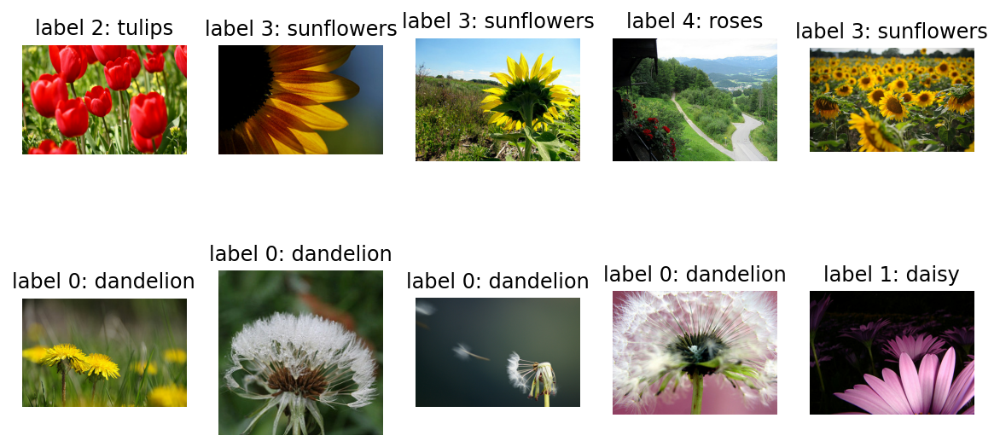

In [9]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

### Dandelion label 0, Daisy label 1, Tulips label 2, Sunflowers label 3, Roses label 4으로 설정되어 있군요.
### 이미지의 사이즈는 전부 제각각이네요. 모델을 학습시킬 때에는 이미지 사이즈를 통일시켜주는 작업을 해야 할 것 같습니다.
### 다음 함수를 이용해 이미지를 같은 포맷으로 통일시켜 봅시다.
### 아래 코드는 이미지의 사이즈를 160x160 픽셀로 통일시킬뿐만 아니라, 각 픽셀 값의 scale을 수정해주는 역할도 합니다.
### 원래 이미지의 각 픽셀값은 RGB 색을 나타낼 때 주로 쓰이는 0~255 사이의 정수값이었습니다. 
### 원래 0과 255 사이의 값들을 그 중간값인 127.5로 나누고 1을 뺐으므로, -1~1 사이의 실수값이 된다.

In [10]:
IMG_SIZE = 160 # All images will be resized to 160x160
def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

### format_example 함수를 raw_train, raw_validation, raw_test 에 map 함수로 적용시켜서 
### 우리가 원하는 모양의 train, validataion, test 데이터셋으로 변환해 보겠습니다. 

In [11]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

### 아래는 raw_train을 train으로 바꾸었다.
### matplotlib으로 이미지를 시각화 할 경우에는 모든 픽셀값이 양수여야 하므로, 
### -1과 1 사이의 픽셀값을 1을 더한 후 2로 나눠서 0~1 사이의 값으로 변환하였다.

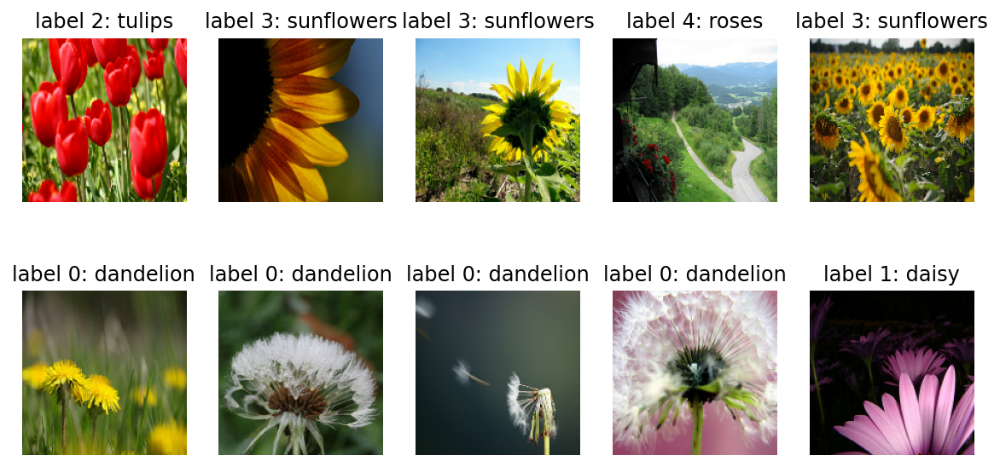

In [12]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

### 다시 확인해 보니 모든 이미지의 크기가 균일해진 것을 확인할 수 있습니다.
### IMG_SIZE를 160으로 지정해 줌으로써, 모든 이미지의 크기를 (160, 160, 3)으로 통일시켰죠.

# 텐서플로우를 활용해 모델 구조 설계하기
### 이미지 준비가 끝났으니 이 이미지들로 학습시킬 모델을 만들어봅시다!
### 먼저 모델 생성에 필요한 다음 함수들을 가져오겠습니다.

In [13]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

### 딥러닝 모델은 언제나 위와 같이 여러 개의 층을 쌓은 형태로 구성됩니다.
### 우리는 Conv2D, MaxPooling2D, Flatten, Dense 라는 네 가지 종류의 레이어를 사용했네요.

In [14]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=5, activation='softmax')
])

### 모델의 전체 구조를 summary로 확인해봅시다.

In [15]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 25600)             0

# 모델 compile 완료 후 이제 진짜 모델을 학습시켜보자! 
### 모델이 학습하는 데에 필요한 "학습률"(learning_rate)이라는 파라미터를 0.0001으로 설정해주고, 
### 모델을 compile 하여 학습할 수 있는 형태로 변환해주도록 하겠습니다.

In [16]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

### compile을 하기 위해서는 세 가지가 필요합니다.
### 바로 optimizer, loss, metrics 라는 친구들입니다. 간단히 설명하자면,
#### (1) optimizer는 학습을 어떻게 최적화시킬 것인지를 결정하기 때문에 최적화 함수라고 부르기도 (label=0)이한다.
#### (2) loss는 모델이 학습해나가야 하는 방향을 결정한다. 
#### 입력이미지가 Dandelion label 0이면 모델 출력이 [1.0, 0.0, 0.0, 0.0, 0.0]에 가깝도록
#### 입력이미지가 Daisy label 1이면 모델출력이 [0.0, 0.1, 0.0, 0.0, 0.0]에 가깝도록
#### 입력이미지가 Tulips label 2이면 모델출력이 [0.0, 0.0, 1.0, 0.0, 0.0]에 가깝도록
#### 입력이미지가 Sunflowers label 3이면 모델출력이 [0.0, 0.0, 0.0, 1.0, 0.0]에 가깝도록
#### 입력이미지가 Roses label 4이면 모델출력이 [0.0, 0.0, 0.0, 0.0, 1.0]에 가깝도록 하는 방향을 제시한다. 
#### (3) metrics는 모델의 성능을 평가하는 척도이다. 분류 문제를 풀 때, 성능을 평가할 수 있는 지표는 정확도(accuracy), 정밀도(precision), 재현율(recall) 등이 있다.
### 이렇게 세 가지를 모두 정해주면서 compile을 마무리하면, 모델은 학습될 준비가 마무리 된 것이다.

## 이제는 모델을 학습시킬 데이터를 준비하자!
### 먼저 한 스텝에 학습시킬 데이터의 개수인 BATCH_SIZE와, 학습 데이터를 적절히 섞어줄 SHUFFLE_BUFFER_SIZE를 설정해주겠습니다.

In [17]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

### BATCH_SIZE에 따라 32개의 데이터를 랜덤으로 뿌려줄 train_batches, validation_batches, test_batches를 만들어 주겠다.
### train_batches는 모델이 끊임없이 학습할 수 있도록 전체 데이터에서 32개를 랜덤으로 뽑아 계속 제공해 줄 것이다.

In [18]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE, drop_remainder=True)
validation_batches = validation.batch(BATCH_SIZE,drop_remainder=True).repeat()
test_batches = test.batch(BATCH_SIZE, drop_remainder=True)

In [19]:
print(validation_batches)

<RepeatDataset shapes: ((32, 160, 160, 3), (32,)), types: (tf.float32, tf.int64)>


### train_batches에서 하나의 batch만 꺼내 데이터를 확인해볼까요?

In [20]:
for image_batch, label_batch in train_batches.take(1):
    pass

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

### image_batch의 shape는 [32, 160, 160, 3]을, label_batch의 shape는 [32]를 나타낸다.
### (1) image_batch - shape은 (160, 160, 3), 가로 160, 세로 160, RGB 3 총 32개 이미지
### (2) label - Dandelion label 0, Daisy label 1, Tulips label 2, Sunflowers label 3, Roses label 4으로 정답 label을 나타냄. 한 batch에 데이터가 32개라면 label은 0 또는 1의 32개의 숫자로만 구성

### 본격적으로 모델을 학습시켜보기 전에, 초기 모델의 성능은 어떤지 확인해 보겠습니다. 
### validation(검증)을 하기 위한 데이터셋인 validation_batches를 이용해 20번의 예측을 해 보고 
### 평균 loss와 평균 accuracy를 확인해 보겠습니다.

In [21]:
validation_steps = 10
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

10/10 [==============================] - 0s 12ms/step - loss: 1.6359 - accuracy: 0.1406
initial loss: 1.64
initial accuracy: 0.14


### loss는 약 1.62이, accuracy는 약 24%가 나왔군요.
### 여기서 loss는 말 그대로 "손실"이라는 뜻으로, 얼마나 모델이 "틀렸는지" 나타냅니다. 
### 즉, 낮을수록 좋은 것이죠. 또한 accuracy는 예상할 수 있듯, 몇 퍼센트의 정확도를 보이느냐에 대한 수치입니다. 
### 우리는 지금 강아지와 고양이를 분류하려고 하는데, 두 장 중 하나를 찍어도 50%는 나올테니 
### 지금 모델은 전혀 의미없는 예측을 하고 있는 것이라고 할 수 있습니다.

## 그러면, 10 epoch를 학습시켜서 정확도가 어떻게 변하는지 확인해 보겠습니다.

In [22]:
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches,
                    validation_steps=validation_steps
                   )

Epoch 1/10
91/91 [==============================] - 3s 29ms/step - loss: 1.3223 - accuracy: 0.4348 - val_loss: 1.1352 - val_accuracy: 0.5219
Epoch 2/10
91/91 [==============================] - 2s 26ms/step - loss: 1.0720 - accuracy: 0.5652 - val_loss: 1.1259 - val_accuracy: 0.5531
Epoch 3/10
91/91 [==============================] - 2s 26ms/step - loss: 0.9623 - accuracy: 0.6288 - val_loss: 1.1043 - val_accuracy: 0.5562
Epoch 4/10
91/91 [==============================] - 2s 26ms/step - loss: 0.8551 - accuracy: 0.6710 - val_loss: 1.1283 - val_accuracy: 0.5312
Epoch 5/10
91/91 [==============================] - 2s 26ms/step - loss: 0.7688 - accuracy: 0.7218 - val_loss: 0.9537 - val_accuracy: 0.6375
Epoch 6/10
91/91 [==============================] - 2s 26ms/step - loss: 0.6810 - accuracy: 0.7569 - val_loss: 0.9627 - val_accuracy: 0.6187
Epoch 7/10
91/91 [==============================] - 2s 26ms/step - loss: 0.6090 - accuracy: 0.7850 - val_loss: 0.9837 - val_accuracy: 0.6031
Epoch 8/10
91

## 모델 학습곡선 확인 및 예측 결과 시각화하기
### 첫 번째 accuracy는 훈련 데이터셋에 대한 정확도입니다. 학습하고 있는 데이터에 대한 정확도이죠.
### 두 번째 val_accuracy는 검증 데이터셋에 대한 정확도입니다. 학습하지 않고 있는, 즉 해당 학습 단계에서 보지 않은 데이터에 대한 정확도이죠.

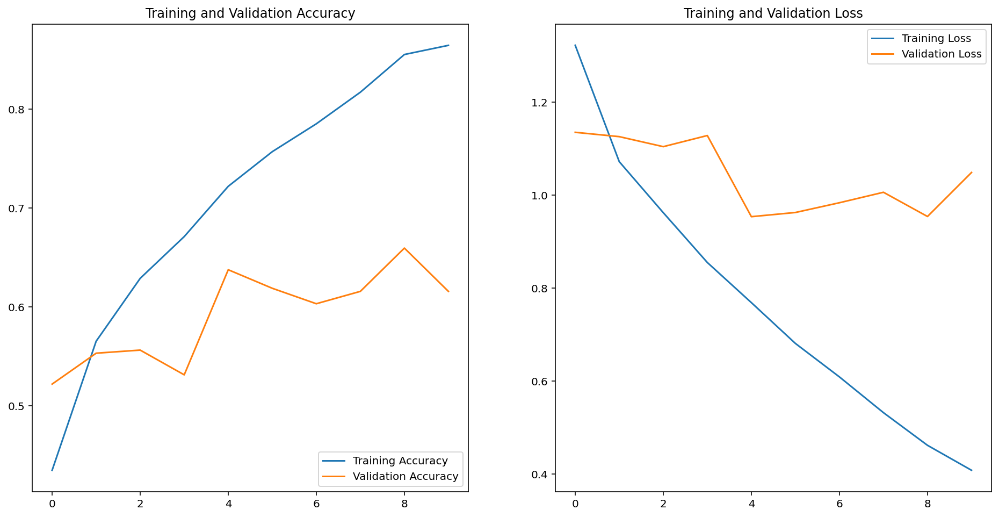

In [23]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

### 10 epoch를 모두 학습한 후에는 훈련 데이터셋에 대한 정확도는 약 90% 남짓, 
### 검증 데이터셋에 대한 accurracy는 약 80% 조금 못미치게 나왔을 것입니다. 
### training accuracy는 꾸준히 오르지만 검증 정확도는 어떤 한계선을 넘지 못하는 것으로 보입니다.
### 심지어 loss 그래프에서, training loss는 계속 안정적으로 줄어들지만 
### validation loss값은 특정 순간 이후로 다시 커지는 모습을 보입니다.
### 이러한 문제를 칭하는 용어는 바로 과적합(Overfitting, 오버피팅) 입니다.
### 모델의 성능이 제대로 올라가려면 "학습하지 않은" 데이터에 대해서도 성능이 좋아야 하는데, 
### 훈련 데이터만으로 계속 학습하다보니 그 데이터에만 과도하게 적합(fitting) 되어서 
### 일반화 능력이 떨어지게 되는 것이죠. 
### 딥러닝 모델을 학습시킬 때에는 이러한 과적합 문제를 예민하게 다루고, 
### 과적합이 되지 않는 순간을 잘 잡아내 일반화가 잘 되는 모델로 학습시키는 것이 중요합니다.

### 모델의 예측 결과를 확인하고 싶을 때에는 다음과 같이 model.predict를 활용합니다.

In [24]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[2.24998163e-04, 1.59518083e-03, 4.96194392e-01, 6.76746760e-03,
        4.95217949e-01],
       [7.04768360e-01, 2.80958086e-01, 8.44492484e-03, 2.61943846e-04,
        5.56673948e-03],
       [2.90613025e-01, 1.22933760e-01, 2.89502293e-01, 2.88611680e-01,
        8.33917502e-03],
       [4.51376662e-02, 1.61982879e-01, 4.15754139e-01, 3.04125510e-02,
        3.46712828e-01],
       [7.09990203e-01, 9.91598219e-02, 7.19730109e-02, 2.66507026e-02,
        9.22261477e-02],
       [4.94304523e-02, 2.92955041e-01, 9.49431136e-02, 3.69958840e-02,
        5.25675476e-01],
       [1.41165289e-03, 1.10524178e-01, 7.02306867e-01, 3.89714888e-03,
        1.81860194e-01],
       [2.84224674e-02, 1.04066342e-01, 4.03345078e-02, 7.96427019e-03,
        8.19212377e-01],
       [4.99635711e-02, 9.22690437e-04, 3.37074138e-02, 9.12592947e-01,
        2.81325937e-03],
       [9.85158980e-01, 1.05966236e-02, 5.79888059e-04, 1.15602830e-04,
        3.54898092e-03],
       [9.31536674e-01, 1.9412

### 이에 따라 prediction 값들을 실제 추론한 라벨(고양이:0, 강아지:1)로 변환해 보겠습니다. 
### 실제로 모델은 각 이미지를 강아지라고 판단했는지, 고양이로 판단했는지 보기 위해서요!

In [25]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 2, 0, 4, 2, 4, 3, 0, 0, 3, 4, 4, 0, 3, 2, 0, 0, 4, 2, 0,
       1, 0, 1, 0, 4, 4, 2, 1, 0, 0])

### 이제 32장의 image들과 32개의 label, 
### 그리고 32개의 prediction을 얻었으니 각각을 모두 시각화해서 확인하겠습니다.

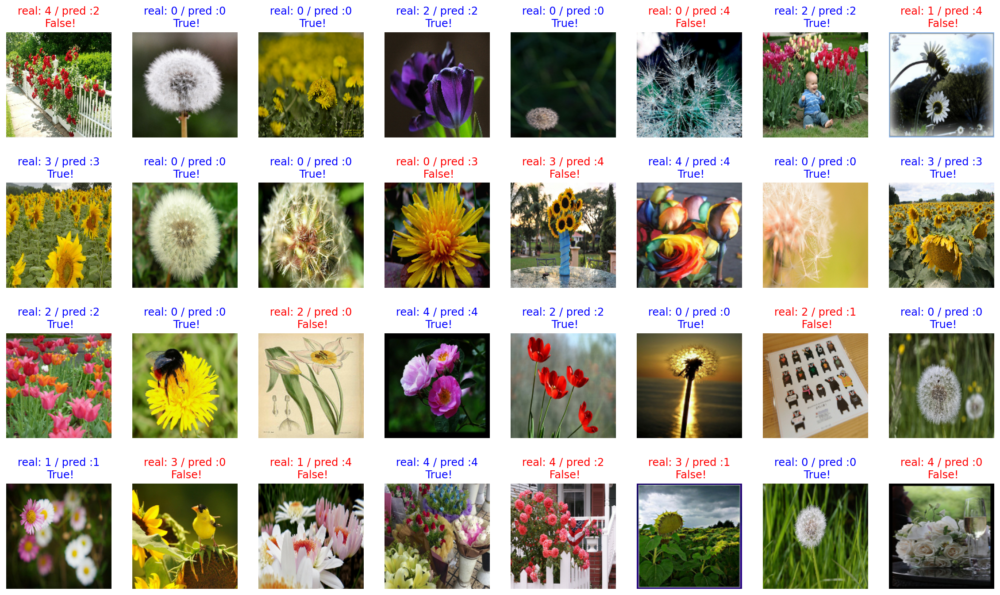

In [26]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

### 위의 32개 이미지에 대해서는 예측(prediction)의 정확도(accuracy)가 몇인가요? 
### 한번 위의 코드에서 필요한 부분만 빼내어, 직접 맞은 예측의 개수를 세는 코드를 만들어서 계산해 보세요!

In [27]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100)    # 약 70% 내외

62.5


### 어떤가요? 대부분 맞았지만, 틀린 것도 종종 보입니다.
### 틀린 이미지들을 한 번 더 유심히 보세요. 모두 이해해주지는 못하더라도, 
### 어딘가 다른 명확한 이미지들보다는 조금 어려웠을 수 있다는 생각이 들지 않나요?
### 여기까지! 우리가 직접 모델을 설계해서 만들어보고, 학습시켜보는 것까지 진행해 보았습니다.
### 그럼 다음 스텝에서는? 네! 우리가 만든 모델 말고, 
### 우리보다 똑똑하고 돈 많은 누군가가 이미 만들어 놓은 모델을 활용해 볼 것입니다!
### 우리는 약 80%정도의 검증 정확도까지 달성했죠! 
### 그럼 엄청 크고, 학습시간도 오래 걸리는 모델을 이미 학습시켜 놓은 것을 가져다 쓰면 어떨까요?

## 사전 학습 모델인 VGG16을 가져오고, 모델의 구조 확인하기

In [28]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

### 우리는 방금 이미 잘 학습된 모델을 가져왔습니다.
### 이 모델은 입력된 이미지를 입력받으면 해당 이미지의 특징을 쏙쏙 잘 뽑아낸 특징 벡터를 추출해낼 수 있죠.
### 실제로 모델에 이미지 데이터가 들어가면 어떻게 되는지 확인해 보겠습니다. 
### 우리가 학습할 때 사용했던 데이터인 image_batch를 넣어보죠.
### 넣기 전에 image_batch의 원래 사이즈를 다시 확인해봅시다.

In [29]:
image_batch.shape

TensorShape([32, 160, 160, 3])

### 다시 한번 짚어보면, 32는 이미지의 장수, 즉 32장의 이미지가 들어있다는 뜻이고, 
### 각 이미지의 크기는 (160, 160, 3)이었습니다.
### 160은 각각 height와 width, 그리고 3은 채널 수로 R, G, B 3개였죠.

### 그렇다면 모델에 이 배치를 넣으면 shape가 어떻게 바뀔까요? 확인해봅시다.

In [30]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

### 이미지의 개수는 32장으로 여전히 같은데, 이미지의 사이즈가 많이 달라졌습니다.
### height와 width는 각각 5로 매우 작아졌고, 512로 channel이 늘어났군요.
### 이 벡터는 이미지에서 특징을 추출해 낸 "특징 벡터"라고 부르기도 합니다.

In [31]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

### VGG16 모델은 위와 같은 구조로 되어 있습니다.
### 이미지가 Input 부분에서 입력되면 여러 개의 레이어를 거친 후 Output으로 출력되죠.
### 다만, 우리는 이 모델을 그대로 쓰지 않고 Transfer Learning 시킬 것이기 때문에 
### Dense Layer는 쓰지 않습니다. 이 부분은 우리가 새로 만들어주어야 합니다.

## 모델의 마지막 부분만, 내 입맛대로 재구성하기
## VGG16 끝단에 classifier 레이어 붙여서 원하는 구조의 분류 모델 만들기
### 자, VGG16 모델을 가져와서 모델이 이미지로부터 특징을 추출하는 벡터를 내뱉는다는 것을 확인했습니다.
### 그럼 이제 모델이 추출한 특징벡터로부터 분류를 할 수 있는 classifer를 우리가 구성해야 하는데요!
### 한 가지 이슈가 있습니다. VGG16 모델이 출력한 벡터의 shape가 무엇이었는지 기억하나요?

In [32]:
feature_batch.shape

TensorShape([32, 5, 5, 512])

### classifier를 구성하려면 우리는 Fully connected 레이어로 구성해야 합니다.
### Fully connected 레이어는 말 그대로 완전연결 계층이다.

### 말 그대로 이전 계층의 모든 숫자들이 다음 계층의 모든 숫자와 연결이 되어야 하죠.
### 이러한 구조로 인해 Fully connected 레이어에 입력될 수 있는 벡터는 반드시 1차원이어야 합니다.
### 하지만, VGG16이 출력하는 벡터는 몇 차원이었죠? (5, 5, 512)로 3차원의 구조를 가졌습니다.
### 따라서, 우리는 classifier를 구성하기 전에 이 3차원 벡터를 1차원 벡터로 변환하는 작업을 거쳐야 합니다.
### 위에서 우리가 3차원이었던 벡터를 일렬로 쭉 펴는 역할을 하는 계층이 바로 Flatten 레이어였습니다.
### 우리는 사실 위에서 우리만의 모델을 만들며 이러한 작업을 Flatten 계층으로 한 번 했었습니다.

In [33]:
import numpy as np

image = np.array([[1, 2],
                  [3, 4]])

flattened_image = image.flatten()

print("Original image:\n", image)
print("Original image shape:", image.shape)
print()
print("Flattened image:\n", flattened_image)
print("Flattened image shape:", flattened_image.shape)

Original image:
 [[1 2]
 [3 4]]
Original image shape: (2, 2)

Flattened image:
 [1 2 3 4]
Flattened image shape: (4,)


### 2차원의 이미지를 flatten하면 위와 같이 1차원의 이미지로 쭉 펼 수 있었습니다.
### 그런데, 이번에는 조금 다른 방법을 사용할 것입니다.
### 2차원 또는 3차원 벡터를 1차원으로 축소시키는 방법에는 Flattening 하는 것보다 조금 더 좋은 방법이 있거든요.
### 그 방법은 바로 Global Average Pooling입니다.

### 평균값을 활용해 벡터의 차원을 줄이는 방법을 Global Average Pooling이라고 합니다.

In [34]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

In [35]:
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


### 이제 여기에 마지막으로! Dense 레이어들을 붙여주면 우리의 classifier가 완성됩니다.

In [36]:
dense_layer = tf.keras.layers.Dense(512, activation='relu')
prediction_layer = tf.keras.layers.Dense(5, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 5)


### 우리의 데이터들은 처음에 이미지에서 특징을 추출해 줄 VGG16, base_model에 입력되어 특징이 추출된 다음, 
### 그 특징벡터는 global_average_layer를 거쳐 마지막에 prediction_layer까지 통과하며 
### 강아지인지, 고양이인지 예측이 될 것입니다.

### VGG16에 해당하는 base_model은 학습을 시키지 않을 예정이니 
### 학습 여부를 결정하는 trainable 변수를 False로 지정해 "꺼주겠"습니다.

In [37]:
base_model.trainable = False

In [38]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])

In [39]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_3 (Dense)              (None, 5)                 2565      
Total params: 14,979,909
Trainable params: 265,221
Non-trainable params: 14,714,688
_________________________________________________________________


### VGG16을 기반으로 구성된 이미지 분류기를 학습시키고, 직접 만들었던 모델과 결과 비교해 보기

### 이제 모델 학습은 위에서 했던 과정과 같습니다.
### optimizer, loss, metrics를 준비해서 모델을 compile 하기만 하면 되죠.

In [40]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

### 초기 손실과 정확도 값을 확인해 봅시다.
### 아직 학습이 되지 않은 상태니, 50% 정도를 예상해볼 수 있겠어요!

In [41]:
validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

20/20 [==============================] - 1s 56ms/step - loss: 1.8356 - accuracy: 0.1281
initial loss: 1.84
initial accuracy: 0.13


### 역시 50% 정도로, 무의미하게 두 선택지 중 하나로 찍는 상태인 것 같군요.
### 그럼 이제 어서, 모델을 학습시켜 보겠습니다! 과연 최종 성능은 어떨까요?! 가보시죠!

In [43]:
EPOCHS = 10   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches,
                    validation_steps=validation_steps)

Epoch 1/10
91/91 [==============================] - 7s 79ms/step - loss: 0.6372 - accuracy: 0.7946 - val_loss: 0.6104 - val_accuracy: 0.7859
Epoch 2/10
91/91 [==============================] - 7s 80ms/step - loss: 0.6040 - accuracy: 0.8032 - val_loss: 0.5997 - val_accuracy: 0.7844
Epoch 3/10
91/91 [==============================] - 7s 80ms/step - loss: 0.5729 - accuracy: 0.8108 - val_loss: 0.5837 - val_accuracy: 0.7937
Epoch 4/10
91/91 [==============================] - 7s 80ms/step - loss: 0.5511 - accuracy: 0.8207 - val_loss: 0.5463 - val_accuracy: 0.8000
Epoch 5/10
91/91 [==============================] - 7s 80ms/step - loss: 0.5269 - accuracy: 0.8283 - val_loss: 0.5457 - val_accuracy: 0.8016
Epoch 6/10
91/91 [==============================] - 7s 80ms/step - loss: 0.5100 - accuracy: 0.8317 - val_loss: 0.5367 - val_accuracy: 0.7969
Epoch 7/10
91/91 [==============================] - 7s 81ms/step - loss: 0.4957 - accuracy: 0.8376 - val_loss: 0.5258 - val_accuracy: 0.8031
Epoch 8/10
91

### 최종 정확도를 좀 보세요! 81%를 넘어섰습니다.
### 그래프로 학습 과정을 살펴봅시다.

Text(0.5, 0, 'epoch')

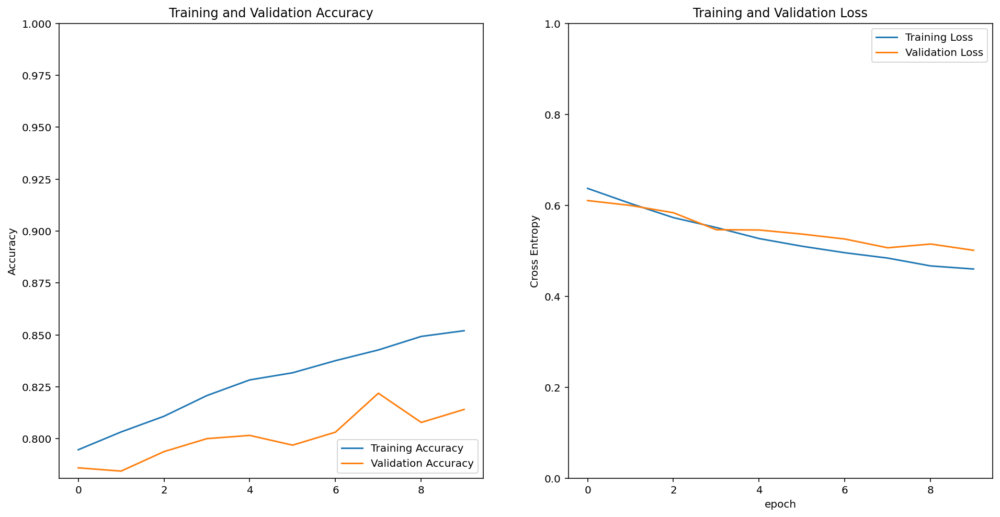

In [44]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')


### 우리가 직접 만들었던 모델과는 다르게 시작부터 75%를 넘는 정확도에서 꾸준히 올라갈뿐더러 
### validation loss도 매우 안정적으로 학습됩니다.
### 역시, 잘 학습된 모델을 가져와서 쓰는 게 최고군요!
### 위에서 했던 것과 같이 또 32개의 test sample에 대한 예측 결과를 눈으로도 확인해 보겠습니다.
### 샘플을 test_batches에서 가져와서 예측 결과를 만들어보죠!

In [45]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[1.25147989e-02, 7.39519671e-02, 7.72778928e-01, 3.49005684e-02,
        1.05853744e-01],
       [9.99009967e-01, 8.87743721e-04, 5.24142524e-06, 4.63483484e-05,
        5.07127406e-05],
       [7.19730556e-01, 1.48992822e-01, 2.04901174e-02, 8.68948847e-02,
        2.38916203e-02],
       [1.95786054e-03, 9.60118789e-03, 5.68931878e-01, 5.33464877e-03,
        4.14174467e-01],
       [6.10385001e-01, 3.45313072e-01, 1.23902783e-02, 1.43204695e-02,
        1.75911486e-02],
       [9.29001927e-01, 5.09031378e-02, 2.67601386e-03, 1.63387656e-02,
        1.08014839e-03],
       [9.61377379e-03, 1.55659532e-02, 8.26377213e-01, 9.58497524e-02,
        5.25932536e-02],
       [3.95881265e-01, 5.19941807e-01, 8.22031288e-04, 8.02484378e-02,
        3.10644670e-03],
       [6.96193194e-03, 1.36184634e-03, 2.18230337e-02, 8.98876131e-01,
        7.09770098e-02],
       [9.98934090e-01, 1.00853981e-03, 1.00749764e-06, 5.41466907e-05,
        2.24473320e-06],
       [9.67981160e-01, 2.7807

### 역시 0과 1 사이의 값으로 확률값을 출력하였습니다.
### 이번에도 prediction 값들을 실제 추론한 라벨(고양이:0, 강아지:1)로 변환해 보겠습니다.

In [46]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 2, 0, 0, 2, 1, 3, 0, 0, 3, 3, 4, 0, 3, 2, 0, 2, 4, 2, 0,
       1, 0, 1, 3, 2, 4, 4, 3, 0, 4])

### 좋습니다! 바로 확인해봅시다.

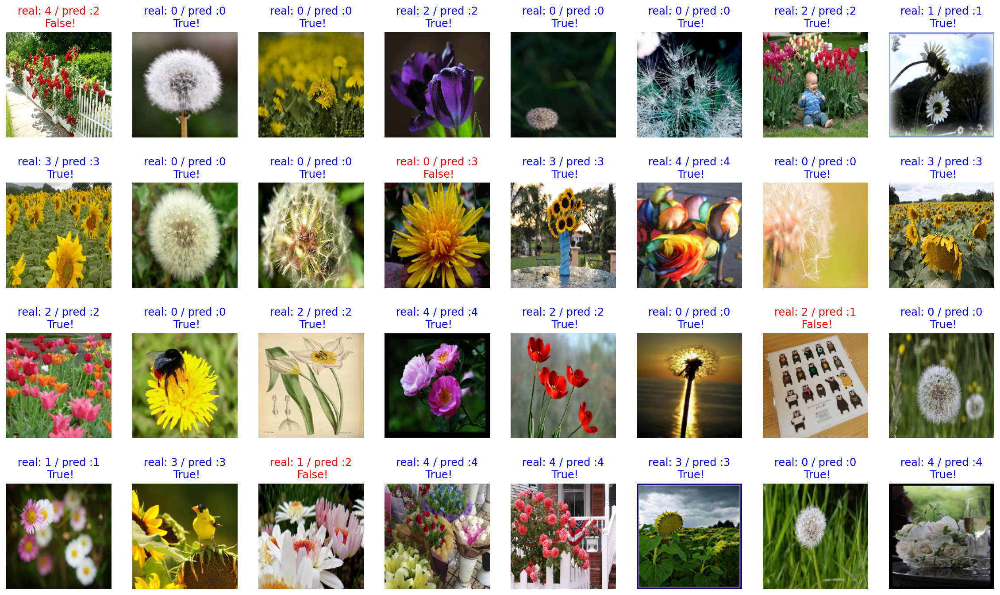

In [47]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

### 거의 100%에 가까운 정확도를 보여줍니다.
### 이렇게 Transfer Learning의 위력을 실감할 수 있네요. 
### 확실히, 이미지를 분류할 때는 직접 모델을 만들기보다는, 똑똑한 모델을 가져와서 쓰는 편이 낫겠죠?

## 잘 학습된 모델은 저장해두고, 언제든 꺼내 쓰도록 하자!
## 모델을 save 하고, 다시 load 해와서 사용하는 방법 익히기
### 자, 이제 우리가 많은 시간과 노력을 들여서 모델을 학습시켰으니, 저장하는 법을 알아보겠습니다.
### 열심히 학습시켜서 한 번만 쓰기에는 아까우니까요! 저장해두고 언제든 다시 쓸 수 있다면 좋겠죠.
### 모델을 저장하는 법은 생각보다 아주 간단하답니다!
### 다음과 같이 save_weights 함수를 활용합니다. 파라미터로 저장하고 싶은 경로만 입력해주면 되죠!
### 다음과 같이 ./checkpoint/checkpoint 라는 경로로 저장하게 되면 
### 현재 위치에 있는 checkpoint라는 폴더 내에 checkpoint라는 파일명으로 저장됩니다.

In [51]:
import os

checkpoint_dir = os.getenv("HOME") + "/aiffel/flowers/checkpoint"
checkpoint_file_path = os.path.join(checkpoint_dir, 'checkpoint')

if not os.path.exists('checkpoint_dir'):
    os.mkdir('checkpoint_dir')
    
model.save_weights(checkpoint_file_path)     # checkpoint 파일 생성

if os.path.exists(checkpoint_file_path):
  print('checkpoint 파일 생성 OK!!')

checkpoint 파일 생성 OK!!


In [52]:
print(checkpoint_dir)

/home/aiffel0042/aiffel/flowers/checkpoint


In [53]:
print(checkpoint_file_path)

/home/aiffel0042/aiffel/flowers/checkpoint/checkpoint


## 학습된 모델에 원하는 이미지를 입력해 예측 결과 확인해 보기

### 원하는 이미지를 이전 스텝에서 만든 ~/aiffel/flowers/images 라는 폴더에 저장해주도록 하겠습니다.

In [54]:
img_dir_path = os.getenv("HOME") + "/aiffel/flowers/images"
os.path.exists(img_dir_path)

True

### 저는 my_dog.jpeg라는 파일과 my_cat.jpeg라는 파일을 저장하였습니다.
### 이미지 파일을 저장했다면, 이제 tensorflow 모델에 입력해주기 위해 
### load_img, img_to_array 함수를 가져오도록 하겠습니다.

In [55]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

### 이제 이미지를 가져와보죠!
### 단, 우리의 모델은 위에서 설정했다시피 (160, 160) 사이즈만 입력받을 수 있기 때문에 
### 파라미터로 이미지 사이즈를 넣어주어야 합니다.

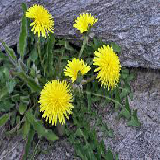

In [60]:
IMG_SIZE = 160
flower_image_path = os.path.join(img_dir_path, 'dandelion_0.jpeg')

flower_image = load_img(flower_image_path, target_size=(IMG_SIZE, IMG_SIZE))
flower_image

### 네, 이미지도 잘 가져왔고, 사이즈도 적당히 맞춰진 것 같군요!
### 그러면 이제 모델에 넣을 수 있도록 이미지를 array, 즉 배열 자료형으로 변환해주겠습니다.

In [63]:
flower_image = img_to_array(flower_image).reshape(1, IMG_SIZE, IMG_SIZE, 3)
flower_image.shape

(1, 160, 160, 3)

### 위에서 많이 사용했던 이미지 데이터의 shape와 같죠? 다만, 이번에는 이미지가 단 한 장이니 맨 앞의 숫자가 1이 됩니다.
### 그러면 이미지를 모델에 넣어 예측해볼까요?!

In [65]:
prediction = model.predict(flower_image)
prediction

array([[2.9303284e-25, 2.2363989e-01, 0.0000000e+00, 7.7636009e-01,
        0.0000000e+00]], dtype=float32)

### 강아지일 확률이 아주 확고한 1.0이군요. 너무 쉬운가봅니다.
### 위의 과정을 함수로 만들어 원하는 이미지를 자유자재로 예측해 보도록 하겠습니다.

In [71]:
def show_and_predict_image(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    image = img_to_array(image).reshape(1, img_size, img_size, 3)
    prediction = model.predict(image)[0]
    dandelion_percentage = round(prediction[0] * 100)
    daisy_percentage = round(prediction[1] * 100)
    tulips_percentage = round(prediction[2] * 100)
    sunflowers_percentage = round(prediction[3] * 100)
    roses_percentage = round(prediction[4] * 100)
    print(f"""This image seems {dandelion_percentage}% dandelion, and {daisy_percentage}% daisy,
           and {tulips_percentage}% tulips, and {sunflowers_percentage}% sunflowers,
           and {roses_percentage}% roses.""")

### 여러가지 테스트 이미지를 함수에 넣어봅시다.

This image seems 0.0% dandelion, and 100.0% daisy,
           and 0.0% tulips, and 0.0% sunflowers,
           and 0.0% roses.


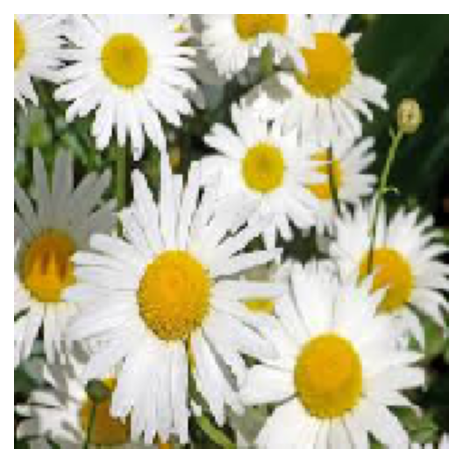

In [73]:
filename = 'daisy_1.jpeg'

show_and_predict_image(img_dir_path, filename)

This image seems 0.0% dandelion, and 0.0% daisy,
           and 100.0% tulips, and 0.0% sunflowers,
           and 0.0% roses.


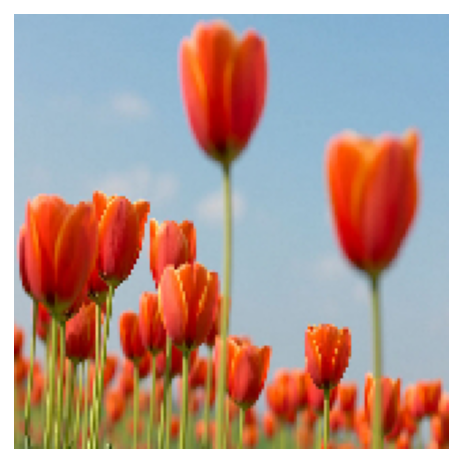

In [74]:
filename = 'tulips_2.jpeg'

show_and_predict_image(img_dir_path, filename)

This image seems 0.0% dandelion, and 42.0% daisy,
           and 0.0% tulips, and 58.0% sunflowers,
           and 0.0% roses.


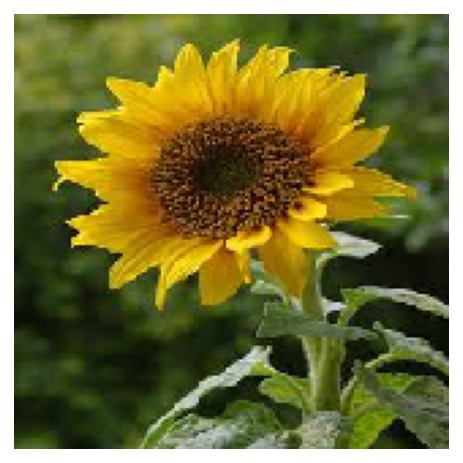

In [75]:
filename = 'sunflowers_3.jpeg'

show_and_predict_image(img_dir_path, filename)

This image seems 0.0% dandelion, and 0.0% daisy,
           and 0.0% tulips, and 0.0% sunflowers,
           and 100.0% roses.


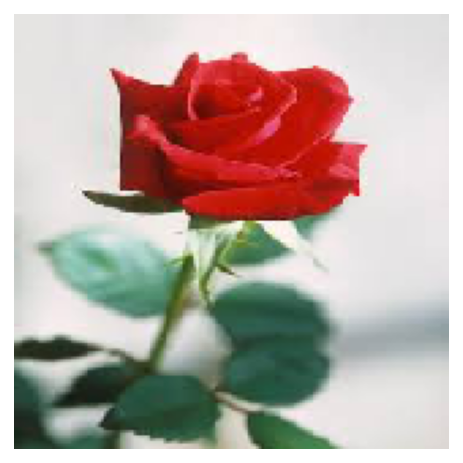

In [76]:
filename = 'roses_4.jpeg'

show_and_predict_image(img_dir_path, filename)

### 각 꽃 분류를 100%의 정확도로 맞추는군요. 그러면 이제 제 얼굴을 넣어봅시다.
### 제 얼굴은 어떤 꽃으로 분류될까요?

This image seems 0.0% dandelion, and 0.0% daisy,
           and 0.0% tulips, and 95.0% sunflowers,
           and 5.0% roses.


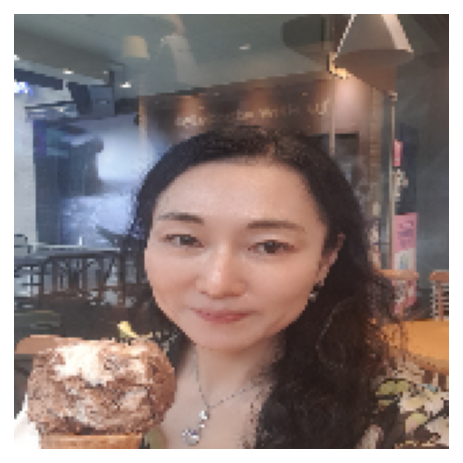

In [77]:
filename = "MyFace.jpg"
show_and_predict_image(img_dir_path, filename)

### 내 얼굴은 해바라기로 분류되었네요!
### ㅋㅋㅋ 어떤 꽃으로 분류되어도 기분 좋아요!